# Project 12 - Simulating Randomness

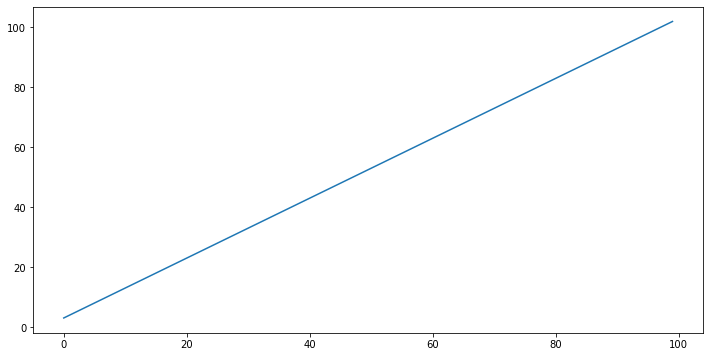

array([  3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,  14,  15,
        16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,  27,  28,
        29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,  40,  41,
        42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,  53,  54,
        55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,  66,  67,
        68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,  79,  80,
        81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,  92,  93,
        94,  95,  96,  97,  98,  99, 100, 101, 102])

In [1]:
import numpy as np
import matplotlib.pyplot as plt

line = np.array([i + 3 for i in range(100)])
figure = plt.figure(figsize = (12,6))
plt.plot(line)
plt.show()
line

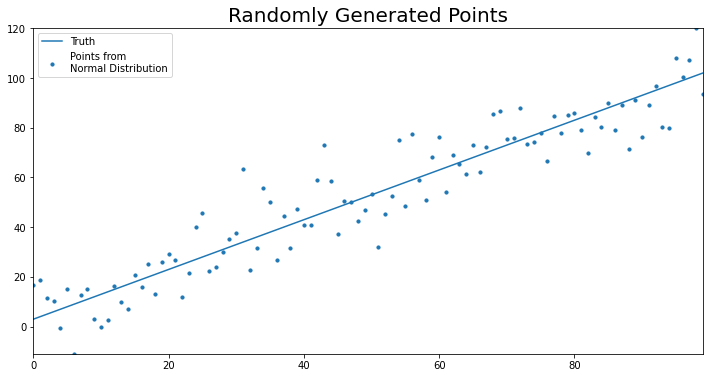

In [2]:
import random

points = []
for point in line:
    points.append(random.normalvariate(point, 10))

figure = plt.figure(figsize = (12, 6))
plt.rcParams["axes.xmargin"] = 0
plt.rcParams["axes.ymargin"] = 0
plt.plot(line, label ="Truth")
plt.scatter(np.arange(len(points)), points, s = 10,
           label = "Points from\nNormal Distribution")
plt.title("Randomly Generated Points", fontsize = 20)
plt.legend(loc = "best")
plt.show()

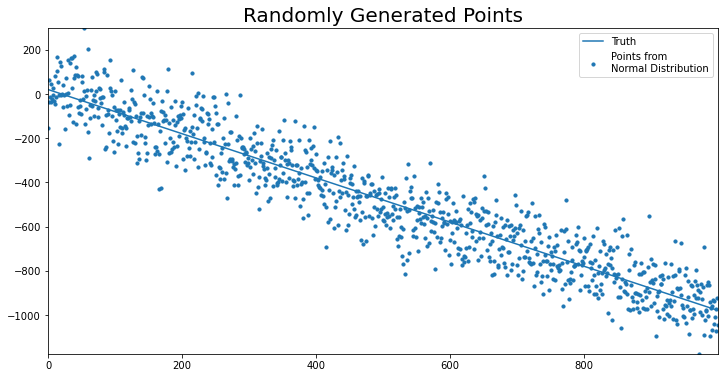

In [3]:
import random

def build_random_data_with_line(y_int, slope, SD = 1, line_length = 100):
    line = np.array([slope * i + y_int for i in range(line_length)])    
    points = []
    for point in line:
        points.append(random.normalvariate(point, SD))
        
    return line, points

def plot_line(line, points, line_name = "Truth",
              title = "Randomly Generated Points"):

    figure = plt.figure(figsize = (12, 6))
    plt.rcParams["axes.xmargin"] = 0
    plt.rcParams["axes.ymargin"] = 0
    plt.plot(line, label =line_name)
    plt.scatter(np.arange(len(points)), points, s = 10,
               label = "Points from\nNormal Distribution")
    plt.title("Randomly Generated Points", fontsize = 20)
    plt.legend(loc = "best")
    plt.show()
    
line, points = build_random_data_with_line(y_int = 20, slope = -1, SD = 100, line_length = 1000)
plot_line(line, points)

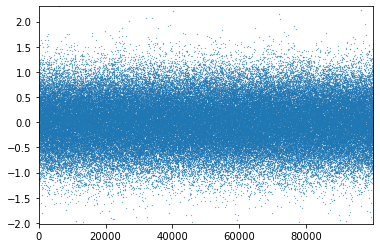

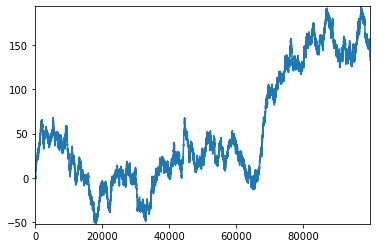

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random


mu = 0

# SD = sigma, variance = sigma**2
sigma = .5
random_list = []
observations = 100000
for i in range(100000):
    random_list.append(random.normalvariate(mu, sigma))

plt.plot(random_list, 
         ls = "",
         linewidth = 1, 
         marker = ".", 
         markersize = .5)

plt.show()
plt.close()

simulation = [] 

for i in range(len(random_list)):
    val = random_list[i]
    if i == 0:
        simulation.append(val)
    else:
        simulation.append(simulation[i-1] + val)
        
plt.plot(simulation)
plt.show()
plt.close()

In [5]:
def run_monte_carlo(mean, sigma, num_sims, sim_dict, index):
    
    for i in range(num_sims):
        sim_dict[i] = {}
        for ix in index:
            sim_dict[i][ix] = random.normalvariate(mean, sigma)

In [6]:
mean = 0
sigma = 1
monte_carlo_sim_dict = {}
num_sims = 2000
index = np.arange(2000)
run_monte_carlo(mean, sigma, num_sims, monte_carlo_sim_dict, index)
        
monte_carlo_sim_df = (pd.DataFrame(monte_carlo_sim_dict))
        
monte_carlo_sim_df

,0,1,2,3,4,5,6,7,8,9,...,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999
0,0.321877,1.930594,-0.357187,-1.137433,-1.797414,-1.675424,0.701277,-0.327734,1.451485,-0.117033,...,-1.200651,-2.454852,0.035851,0.582026,2.046831,1.031651,-1.554638,-0.395627,0.254720,0.165203
1,-1.408930,0.348677,-0.182845,0.226352,-0.262841,-0.586064,-0.055336,0.491664,-1.986869,-1.277317,...,-0.047577,-0.311720,0.324665,-0.560211,-0.750313,-0.845582,-1.426710,0.522311,0.698000,-0.880269
2,0.189227,-0.635406,1.162353,0.761178,1.151857,-0.064294,-0.926573,1.885490,-1.519967,-1.318231,...,0.986637,0.672006,0.321247,-1.051582,-1.063955,0.201621,-1.518690,0.655595,-1.442175,1.163672
3,-0.900222,-0.265718,0.635948,-0.296018,2.330054,-0.089707,-0.239404,0.965039,1.124200,-0.552656,...,-0.318640,1.895837,-0.275635,1.182925,2.680909,-0.386320,1.240498,0.284500,-1.012605,0.313435
4,-0.972981,0.092021,-0.910875,-0.867848,1.168745,-0.299994,0.058644,-0.203538,-1.119491,-0.382098,...,0.570398,0.213672,0.051625,0.397024,-0.860594,-0.861703,-0.221159,1.463637,0.976285,-0.955311
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,-0.651938,2.433474,-0.755808,0.690726,-1.022845,-0.841009,0.147595,-2.513734,0.405242,-0.199637,...,1.157217,-0.115307,0.391275,-0.750997,0.804141,-0.056465,-1.501938,-0.519978,0.004761,-0.250751
1996,-1.580657,-0.007445,-0.021916,1.454727,1.110962,-0.715727,0.870466,-0.677617,1.050068,0.766940,...,-0.256919,-1.455132,-0.391688,0.377689,1.068056,0.689248,-1.571885,-0.326696,-1.459723,-0.828508
1997,-0.691177,-0.366162,-0.706148,1.104244,0.508922,0.817076,0.282368,-0.081828,2.169842,-1.175205,...,1.670269,-1.514844,2.997275,0.843887,-1.425375,0.516593,0.779043,-1.127137,-0.585371,-0.516174
1998,0.080720,-0.699740,0.656374,1.736394,-0.920086,-0.537893,-0.538733,0.723491,-1.634894,-1.898316,...,-0.642896,1.130450,-0.210653,1.259238,-0.745594,-0.279903,1.241612,0.648316,0.924182,0.464651


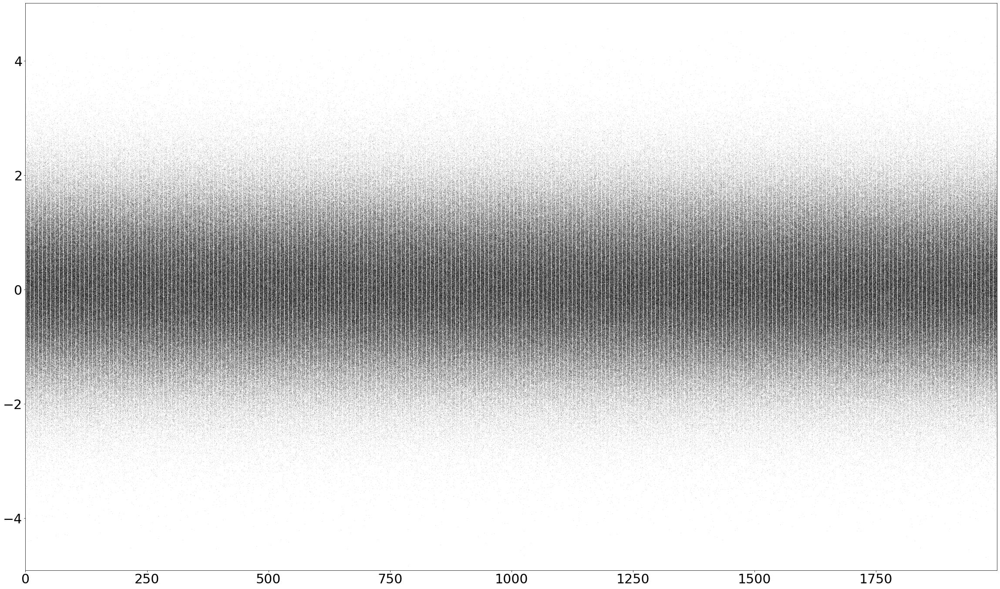

In [7]:
plt.rcParams["axes.xmargin"] = 0
plt.rcParams["axes.ymargin"] = 0
plt.rcParams["font.size"] = 30

fig, ax = plt.subplots(figsize = (40, 24))
monte_carlo_sim_df.plot.line(legend = False, 
                            ls = " ", 
                            marker=".", 
                            markersize = .2, 
                            color ="k", 
                            alpha = .5, 
                            ax = ax)

plt.show()

<ipython-input-8-b75c0b3da472>:8: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([str(int(y * 100)) + "%" for y in y_vals])


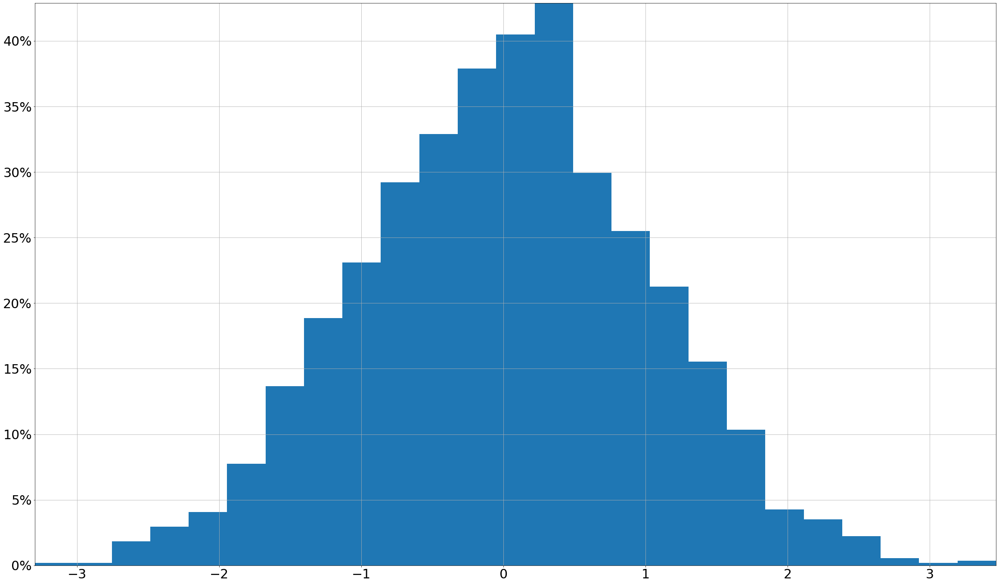

In [8]:
fig, ax = plt.subplots(figsize = (40, 24))
monte_carlo_sim_df.iloc[-1].hist(bins = 25, 
                                density = True,
                                ax = ax)

# Sets vertical axis values as percent
y_vals = ax.get_yticks()
ax.set_yticklabels([str(int(y * 100)) + "%" for y in y_vals])

plt.show()
plt.close()

## Monte Carlo with a Positive Trend

In [9]:
mean = 0.05
sigma = .5
monte_carlo_sim_dict = {}
num_sims = 2000
periods = 2000
index = np.arange(periods)
run_monte_carlo(mean, sigma, num_sims, monte_carlo_sim_dict, index)
pd.DataFrame(monte_carlo_sim_dict)

,0,1,2,3,4,5,6,7,8,9,...,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999
0,0.843923,0.190878,0.254647,0.831550,1.171414,0.111051,0.273252,0.318767,-0.026145,-0.145154,...,0.015937,1.604162,-0.080188,0.511918,-0.109098,-0.147345,1.027777,0.190443,-0.359947,0.142848
1,0.308892,-0.097767,0.006945,0.792464,-0.110258,0.227899,0.692427,0.150211,-0.067533,-0.057978,...,-0.235821,-0.351134,0.823868,0.387498,-0.265178,-0.410935,0.106538,0.264942,0.379942,-0.161416
2,-0.371998,0.624170,1.365308,0.246631,-0.455097,0.493003,0.040740,-0.191987,-0.651418,0.303933,...,-0.251946,-0.476186,-0.190816,0.762787,-0.777001,-0.407960,-0.274652,-0.596750,0.312055,0.033309
3,0.240322,-0.630007,0.255975,0.101462,-0.139374,0.356701,-0.953446,0.775943,0.383862,0.343174,...,0.397262,0.347892,0.122145,-0.125854,0.362616,0.928030,0.774454,-0.543782,-0.452012,-0.655664
4,-0.254546,0.509959,0.282020,0.686954,-0.188687,0.470846,-0.448785,-0.134266,-0.608580,0.311684,...,-0.520454,0.396399,-0.288727,-0.023321,-0.099147,0.573573,-0.400009,-0.251051,-0.888201,0.505608
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,0.912242,-0.952450,-0.353150,1.350885,0.094756,-0.592370,0.795605,-0.709981,-0.176989,-0.170293,...,0.293455,0.849053,0.212764,0.119100,0.398615,-0.253506,0.269854,0.220317,0.278328,-0.245784
1996,-0.040602,0.050710,-0.186436,0.645690,-0.126798,-0.370194,0.190868,-0.578199,-0.484287,-0.288885,...,0.438440,-0.769361,0.641627,-0.327275,-1.029302,-0.476587,0.912373,0.514142,-0.550047,0.743659
1997,0.181762,0.329359,-0.374987,-0.348605,0.195187,-0.103624,0.178018,-0.328032,0.200117,0.970383,...,0.211230,0.519732,-0.327692,0.125458,0.475816,0.130195,0.219099,-0.323556,0.039235,1.157222
1998,0.310879,0.163470,0.423498,-0.361835,-0.582600,0.430731,0.050440,0.677034,0.604950,-0.421844,...,0.127109,-0.026839,0.381137,-0.072200,-0.645157,0.643129,0.161924,-0.404894,-0.483241,-0.867160


In [10]:
monte_carlo_sim_df = pd.DataFrame(monte_carlo_sim_dict).cumsum()
monte_carlo_sim_df

,0,1,2,3,4,5,6,7,8,9,...,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999
0,0.843923,0.190878,0.254647,0.831550,1.171414,0.111051,0.273252,0.318767,-0.026145,-0.145154,...,0.015937,1.604162,-0.080188,0.511918,-0.109098,-0.147345,1.027777,0.190443,-0.359947,0.142848
1,1.152815,0.093111,0.261591,1.624014,1.061156,0.338950,0.965679,0.468978,-0.093679,-0.203132,...,-0.219884,1.253028,0.743680,0.899416,-0.374276,-0.558279,1.134316,0.455385,0.019995,-0.018568
2,0.780817,0.717281,1.626900,1.870645,0.606059,0.831953,1.006419,0.276991,-0.745096,0.100800,...,-0.471830,0.776842,0.552864,1.662203,-1.151277,-0.966240,0.859664,-0.141365,0.332050,0.014741
3,1.021140,0.087274,1.882875,1.972107,0.466684,1.188655,0.052972,1.052934,-0.361235,0.443974,...,-0.074568,1.124734,0.675009,1.536349,-0.788661,-0.038210,1.634118,-0.685147,-0.119962,-0.640924
4,0.766594,0.597234,2.164895,2.659061,0.277998,1.659501,-0.395812,0.918669,-0.969815,0.755658,...,-0.595022,1.521133,0.386282,1.513028,-0.887808,0.535363,1.234110,-0.936198,-1.008164,-0.135315
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,108.499455,84.973353,105.486514,137.359856,128.625492,107.803076,83.376133,133.518298,147.753591,98.155876,...,96.344565,106.674122,82.716737,97.105384,83.880131,87.985725,81.694475,57.670373,112.856061,141.578631
1996,108.458854,85.024063,105.300078,138.005546,128.498694,107.432882,83.567001,132.940099,147.269304,97.866991,...,96.783005,105.904761,83.358364,96.778109,82.850829,87.509137,82.606849,58.184516,112.306014,142.322289
1997,108.640616,85.353422,104.925091,137.656942,128.693880,107.329258,83.745019,132.612068,147.469421,98.837374,...,96.994235,106.424492,83.030672,96.903567,83.326645,87.639332,82.825947,57.860959,112.345249,143.479511
1998,108.951496,85.516892,105.348589,137.295107,128.111280,107.759989,83.795459,133.289101,148.074371,98.415530,...,97.121344,106.397653,83.411809,96.831367,82.681488,88.282461,82.987871,57.456066,111.862008,142.612351


In [11]:
def plot_monte_carlo_sim(sim_data, 
                        title = None,
                        logy = True):
    sim_data["mean"] = sim_data.mean(axis = 1)
    fig, ax = plt.subplots(figsize = (40, 24))
    sim_data.drop("mean", inplace = False, axis = 1).plot.line(
        legend = False, 
        marker = ".", 
        markersize = .1, 
        color = "k",
        alpha = 0.05, 
        logy = logy, 
        ax = ax)
    sim_data["mean"].plot.line(
        legend = False, 
        color ="C1",
        linewidth = 5,
        logy = logy,
        ax = ax
    )
    
    plt.title(title, fontsize = 50)
    plt.show()
    plt.close()

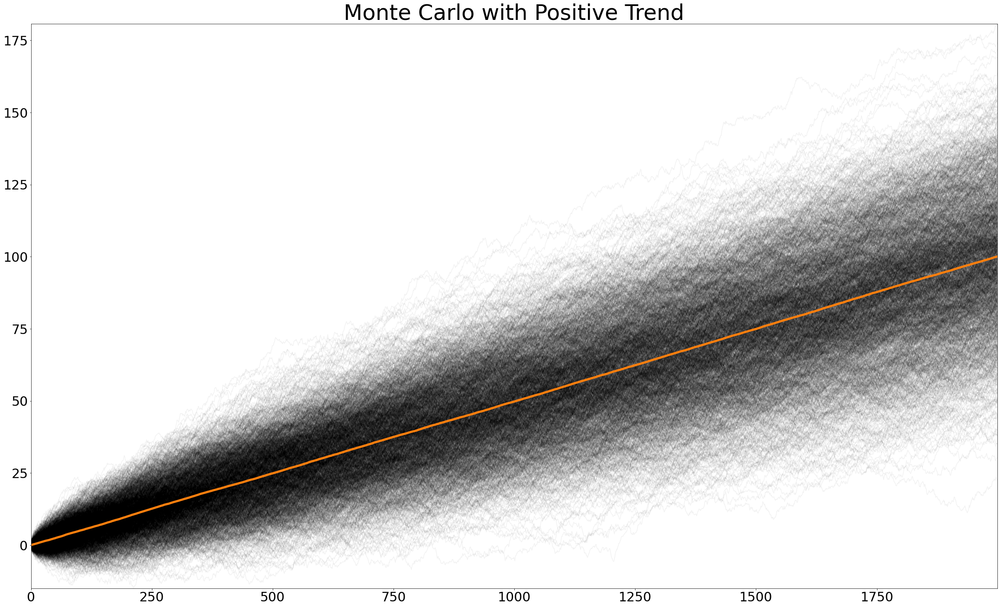

In [12]:
plot_monte_carlo_sim(monte_carlo_sim_df,
                    title = "Monte Carlo with Positive Trend",
                    logy = False)

In [13]:
import pandas_datareader.data as web
import datetime

start = datetime.datetime(2005, 1, 1)
end = datetime.datetime.today()
data_dict = {}
stocks = "MSFT", "AAPL", "IBM", "GOOG"
for name in stocks:
    data_dict[name] = web.DataReader(name, "yahoo", start, end)
data_dict

{'MSFT':                   High         Low        Open       Close       Volume  \
 Date                                                                      
 2005-01-03   26.950001   26.650000   26.799999   26.740000   65002900.0   
 2005-01-04   27.100000   26.660000   26.870001   26.840000  109442100.0   
 2005-01-05   27.100000   26.760000   26.840000   26.780001   72463500.0   
 2005-01-06   27.059999   26.639999   26.850000   26.750000   76890500.0   
 2005-01-07   26.889999   26.620001   26.820000   26.670000   68723300.0   
 ...                ...         ...         ...         ...          ...   
 2021-11-24  338.160004  333.910004  336.279999  337.910004   21661300.0   
 2021-11-26  337.929993  328.119995  334.350006  329.679993   24217200.0   
 2021-11-29  339.029999  334.739990  334.940002  336.630005   28563500.0   
 2021-11-30  337.779999  328.989990  335.320007  330.589996   42833700.0   
 2021-12-01  339.279999  331.980011  335.130005  332.549988   24758231.0   
 
  

In [14]:
close_data_dict = {key:val["Close"] for key, val in data_dict.items()}
close_data_df = pd.DataFrame(close_data_dict)
close_data_df

,MSFT,AAPL,IBM,GOOG
Date,,,,
2005-01-03,26.740000,1.130179,93.451241,100.976517
2005-01-04,26.840000,1.141786,92.447418,96.886841
2005-01-05,26.780001,1.151786,92.256210,96.393692
2005-01-06,26.750000,1.152679,91.969406,93.922951
2005-01-07,26.670000,1.236607,91.567879,96.563057
...,...,...,...,...
2021-11-24,337.910004,161.940002,116.730003,2934.350098
2021-11-26,329.679993,156.809998,115.809998,2856.120117
2021-11-29,336.630005,160.240005,118.500000,2922.280029


In [15]:
close_data_pct_change = close_data_df.pct_change()
close_data_pct_change

,MSFT,AAPL,IBM,GOOG
Date,,,,
2005-01-03,NaN,NaN,NaN,NaN
2005-01-04,0.003740,0.010270,-0.010742,-0.040501
2005-01-05,-0.002235,0.008758,-0.002068,-0.005090
2005-01-06,-0.001120,0.000775,-0.003109,-0.025632
2005-01-07,-0.002991,0.072811,-0.004366,0.028109
...,...,...,...,...
2021-11-24,0.000681,0.003284,-0.000514,-0.000269
2021-11-26,-0.024356,-0.031678,-0.007881,-0.026660
2021-11-29,0.021081,0.021874,0.023228,0.023164


In [16]:
close_data_normalized = close_data_pct_change.add(1).cumprod()
close_data_normalized.fillna(1, inplace = True)
close_data_normalized

,MSFT,AAPL,IBM,GOOG
Date,,,,
2005-01-03,1.000000,1.000000,1.000000,1.000000
2005-01-04,1.003740,1.010270,0.989258,0.959499
2005-01-05,1.001496,1.019118,0.987212,0.954615
2005-01-06,1.000374,1.019908,0.984143,0.930146
2005-01-07,0.997382,1.094169,0.979847,0.956292
...,...,...,...,...
2021-11-24,12.636874,143.287033,1.249101,29.059728
2021-11-26,12.329095,138.747925,1.239256,28.284993
2021-11-29,12.589006,141.782849,1.268041,28.940194


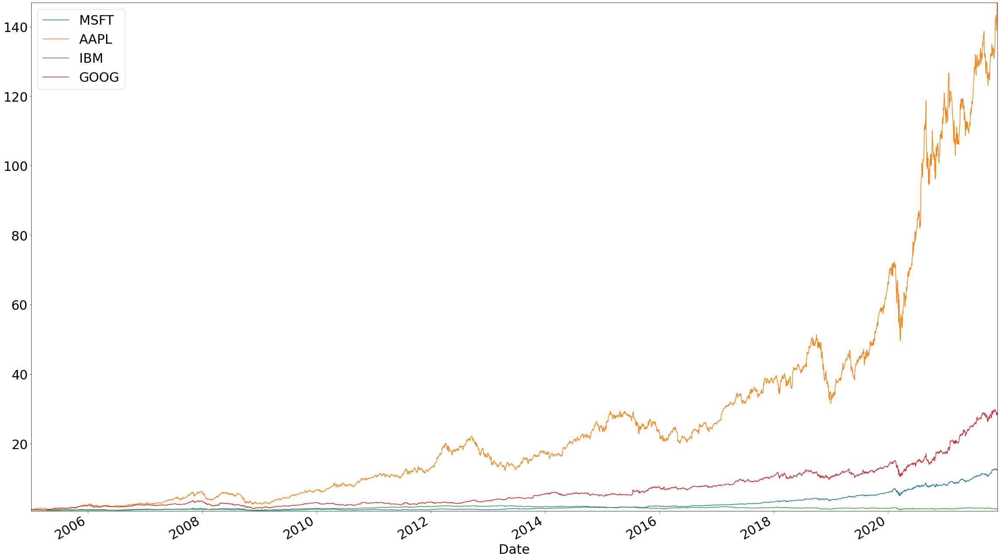

In [17]:
fig, ax = plt.subplots(figsize = (40, 24))
close_data_normalized.plot.line(ax = ax)
plt.show()
plt.close()

## Daily Rate of Return

   $PV = \frac{FV}{(1 + r)^t}$
   
   Overall rate of return: $R=\frac{FV}{PV}$

To find the average rate of return, discount the overall rate of return

   $ r = (R)^{\frac{1}{t}} - 1$
   
   $t$ is measured in trading days

In [18]:
FV = close_data_normalized.iloc[-1]
PV = close_data_normalized.iloc[0]
R = FV.div(PV)
t = close_data_normalized["MSFT"].count()

In [19]:
mean_var_df = pd.DataFrame(
    {"mean": R ** (1 / t) - 1,
     "sigma" : close_data_pct_change.std()})
mean_var_df

,mean,sigma
MSFT,0.000592,0.017057
AAPL,0.001172,0.020771
IBM,0.000054,0.014586
GOOG,0.000785,0.018618


In [20]:
num_sims = 500
dates = list(close_data_df.index)
monte_carlo_sim_dict = {}
for stock in stocks:
    monte_carlo_sim_dict[stock] = {}
    mean = mean_var_df["mean"][stock]
    sigma = mean_var_df["sigma"][stock]   
    run_monte_carlo(mean, 
                    sigma, 
                    num_sims, 
                    monte_carlo_sim_dict[stock], 
                    dates)

In [21]:
monte_carlo_sim_dfs = {stock: pd.DataFrame(monte_carlo_sim_dict[stock]).add(1).cumprod() for stock in stocks}
monte_carlo_sim_dfs

{'MSFT':                   0         1         2           3         4          5    \
 2005-01-03   1.017892  0.995145  1.004019    0.988621  1.006251   0.979274   
 2005-01-04   1.071975  1.004820  1.010733    1.027714  0.999010   0.956674   
 2005-01-05   1.080987  1.029207  0.995446    1.027479  0.997960   0.964241   
 2005-01-06   1.077416  1.038653  1.013327    1.021647  1.015424   0.969809   
 2005-01-07   1.056648  1.050912  0.992699    1.009550  1.012896   1.015058   
 ...               ...       ...       ...         ...       ...        ...   
 2021-11-24  48.242536  5.744145  3.846335  137.677244  4.980027  14.775224   
 2021-11-26  47.794891  5.671282  3.810062  134.416182  4.950067  14.718523   
 2021-11-29  48.020447  5.777246  3.847600  133.348762  5.042223  14.803376   
 2021-11-30  49.791460  5.826702  3.813472  135.581950  5.052310  14.794394   
 2021-12-01  50.010527  5.830068  3.761583  138.372578  5.173686  14.962589   
 
                  6          7          8 

In [37]:
def plot_monte_carlo_sim(sim_data,
                        observed_data = None,
                        title = None,
                        logy = True):
    sim_data["mean"] = sim_data.mean(axis = 1)    
    index = sim_data.index
    fig, ax = plt.subplots(figsize = (40, 24))
    sim_data.drop(["mean"], inplace = False, axis = 1).plot.line(
            legend = False, 
        marker =".", 
        markersize = .1, 
        color = "k", 
        alpha = .05, 
        logy = logy, 
        ax = ax)
    if observed_data is not None:
        observed_data.plot.line(legend = False, 
                                color = "C0",
                               linewidth = 5,
                               logy = logy,
                               ax = ax)
        # find x coordinate of lowest value observed
        obs_text_x = observed_data[observed_data == observed_data.min()].index
        plt.text(obs_text_x, observed_data.loc[obs_text_x] * .7,
                 "Observed", fontsize = 70, color = "C0")

    sim_data["mean"].plot.line(legend = False, 
                               color = "C1",
                              linewidth = 5, 
                               logy = logy, 
                               ax = ax)
    
    plt.text(index[-400], sim_data["mean"].iloc[-400] * 1.5,
            "Exp\nVal",
            fontsize = 70,
            color = "C1")
    plt.title(title, fontsize = 50)
    plt.show()
    plt.close()

In [38]:
print(monte_carlo_sim_dfs["GOOG"])

                    0          1         2         3         4         5  \
2005-01-03   1.014074   0.981364  0.979344  0.982413  0.969415  1.009776   
2005-01-04   1.026480   0.980791  0.994270  0.953240  0.974559  1.020505   
2005-01-05   1.028843   1.001539  1.000055  0.949275  0.979054  0.984516   
2005-01-06   1.027000   1.043292  0.979910  0.928938  0.969346  0.998519   
2005-01-07   1.029578   1.067733  0.981866  0.928165  0.970643  0.964593   
...               ...        ...       ...       ...       ...       ...   
2021-11-24  36.123926  18.359012  8.467911  8.137871  4.806016  1.367371   
2021-11-26  35.708919  18.159395  8.540469  8.323726  4.812163  1.335322   
2021-11-29  35.128572  17.939548  8.513471  8.403990  4.799910  1.316816   
2021-11-30  34.614669  18.302722  8.329542  8.395289  4.847910  1.323451   
2021-12-01  34.622810  18.490508  8.232518  8.459766  4.865939  1.315727   

                    6         7         8          9  ...        491  \
2005-01-03   0.

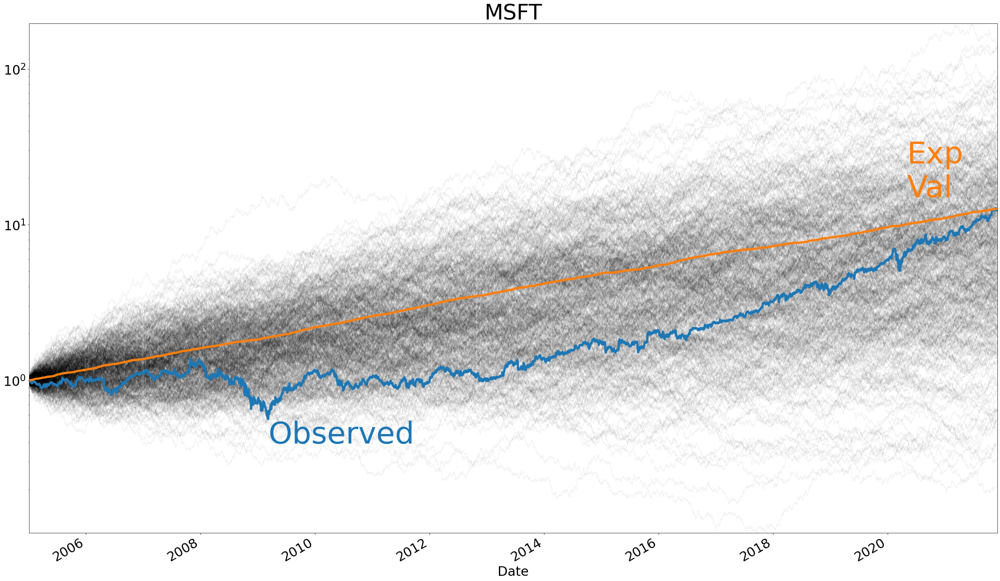

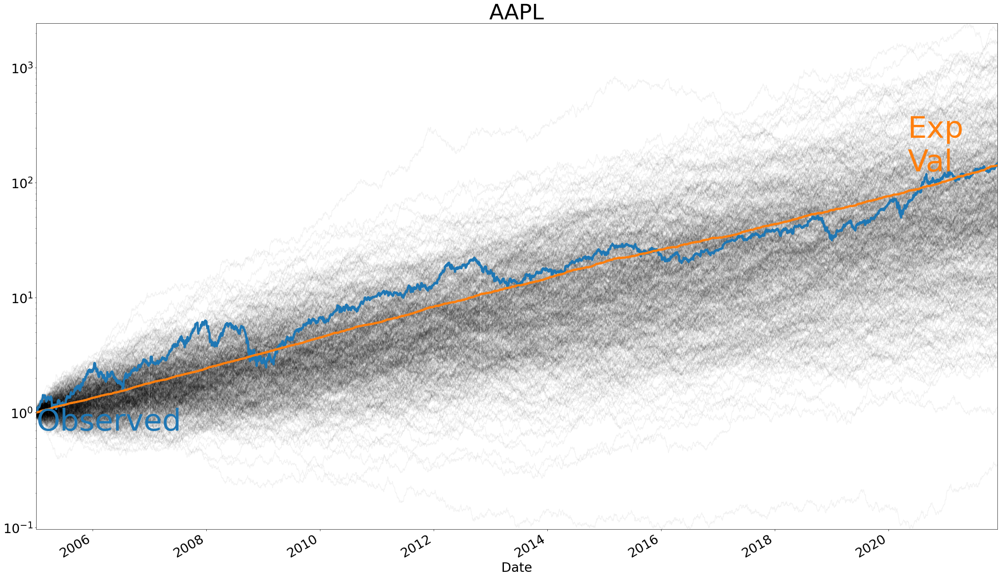

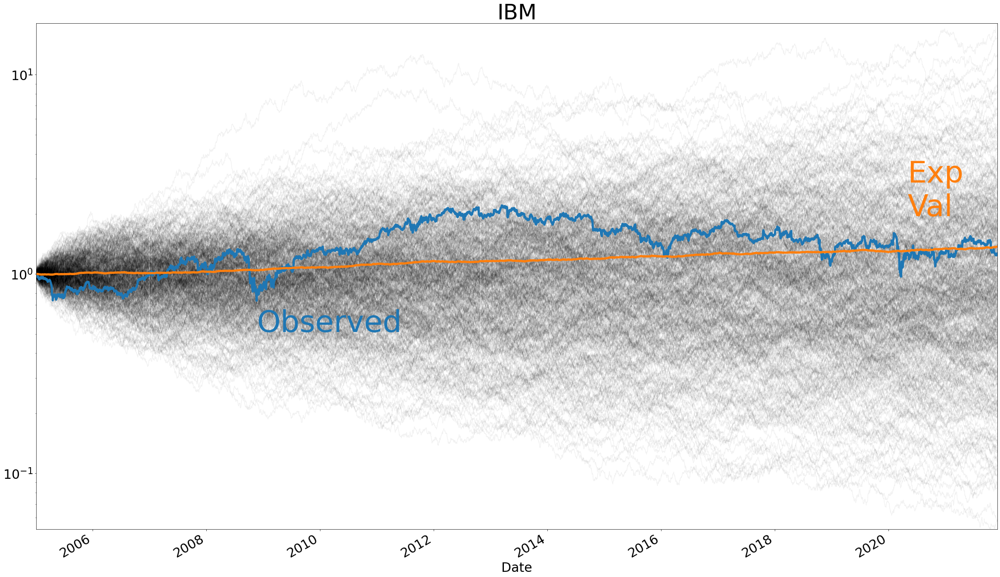

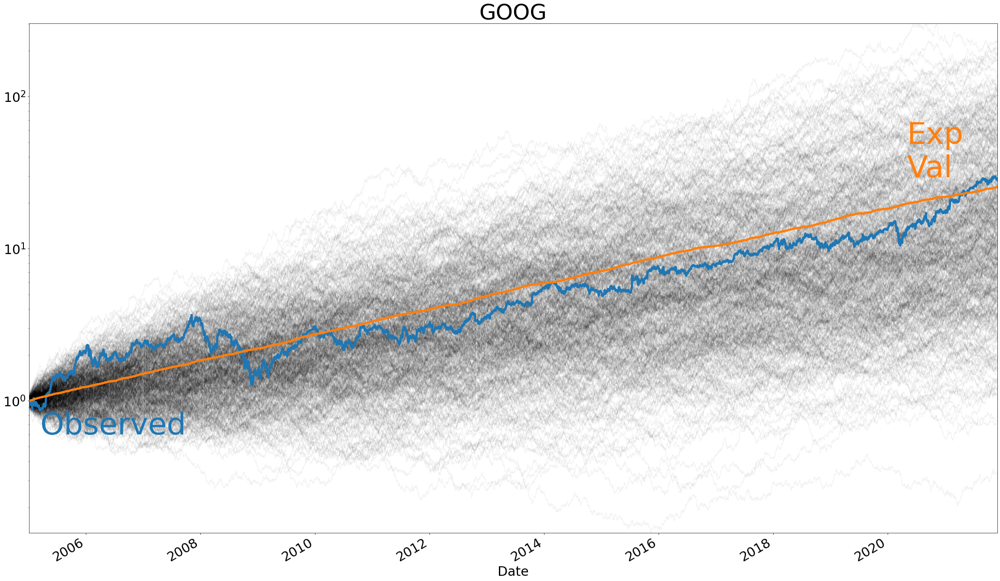

In [39]:
for stock in stocks:
    plot_monte_carlo_sim(sim_data = monte_carlo_sim_dfs[stock],
                         observed_data = close_data_normalized[stock], 
                         title = stock, 
                         logy = True)